In [ ]:
import pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import random
import cv2
import glob
import time

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
for i in glob.glob('images/MEL_hairless/*'):
    name = i[i.rfind('/')+1:]
    os.rename(i, f'images/{name}')

for i in glob.glob('images/ISIC_2019_MEL_NV/*'):
    name = i[i.rfind('/')+1:]
    os.rename(i, f'images/{name}')

In [ ]:
print(len(glob.glob('images/ISIC_2019_MEL_NV/*.jpg')))

0


In [ ]:
for i in glob.glob('train/nevus/ISIC_NEV/*'):
    name = i[i.rfind('/')+1:]
    os.rename(i, f'train/nevus/{name}')
for i in glob.glob('train/melanoma/ISIC_MEL/*'):
    name = i[i.rfind('/')+1:]
    os.rename(i, f'train/melanoma/{name}')

In [ ]:
print(len(glob.glob('train/melanoma/*.jpg')))

1949


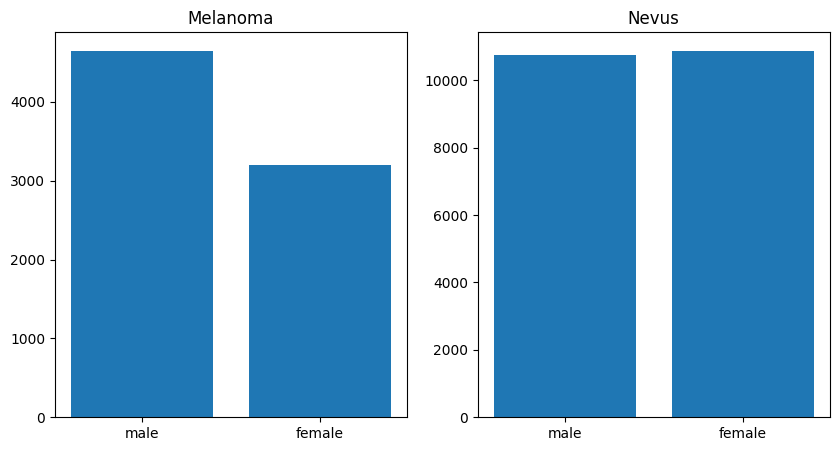

In [ ]:
fg, ax = plt.subplots(1, 2, figsize=(10,5))
ax[0].bar(['male', 'female'], [len(df[(df.dx == 'mel') & (df.sex == 'male')]), len(df[(df.dx == 'mel') & (df.sex == 'female')])])
ax[1].bar(['male', 'female'], [len(df[(df.dx == 'nv') & (df.sex == 'male')]), len(df[(df.dx == 'nv') & (df.sex == 'female')])])

ax[0].set_title('Melanoma')
ax[1].set_title('Nevus')
plt.show()

In [ ]:
df[df['image_id'].duplicated() == False].dx.value_counts()

,count
dx,
nv,15370
mel,6729


In [ ]:
df.dx.value_counts()

,count
dx,
nv,22075
mel,7991
bkl,1099
bcc,514
akiec,327
vasc,142
df,115


In [ ]:
df.describe()

,age,has_hair
count,31626.000000,32263.000000
mean,50.404730,0.031894
std,17.351169,0.175721
min,0.000000,0.000000
25%,40.000000,0.000000
50%,50.000000,0.000000
75%,65.000000,0.000000
max,85.000000,1.000000


In [ ]:
df.dx.value_counts()

,count
dx,
nv,22075
mel,7991


In [ ]:
def hair_remove(image):
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    kernel = cv2.getStructuringElement(1,(17,17))
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)

    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)

    return final_image

def color_change(image):
    rows, cols = 224, 224
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(image)
    h += 10
    s += np.random.randint(0, 1,size=(rows, cols), dtype=np.uint8 )
    v += np.random.randint(0, 1,size=(rows, cols) , dtype=np.uint8 )
    image = cv2.merge([h,s,v ])
    image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)
    return image

In [ ]:
def show_images(df, image_folder, localization=None, augmentation=lambda x: x, color=None, st_img_id=None):
    if st_img_id == None:
        if localization:
            sample = df[df['localization'] == localization].sample(16)
        else:
            sample = df.sample(16)
    else:
        if localization:
            sample = df[df['localization'] == localization][st_img_id:st_img_id+16]
        else:
            sample = df[st_img_id:st_img_id+16]
    images = []
    for img_path in sample.image_id:
        img = cv2.imread(image_folder+'/'+img_path + '.jpg')
        img = cv2.resize(img, (224, 224))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = np.array(augmentation(img))
        img = img.astype(np.float32)/255.
        images.append(img)

    fx, ax = plt.subplots(4, 4, figsize=(10, 7))
    for i, img in enumerate(images):
        ax[i//4, i%4].imshow(img)
        ax[i//4, i%4].axis('off')

    plt.show()


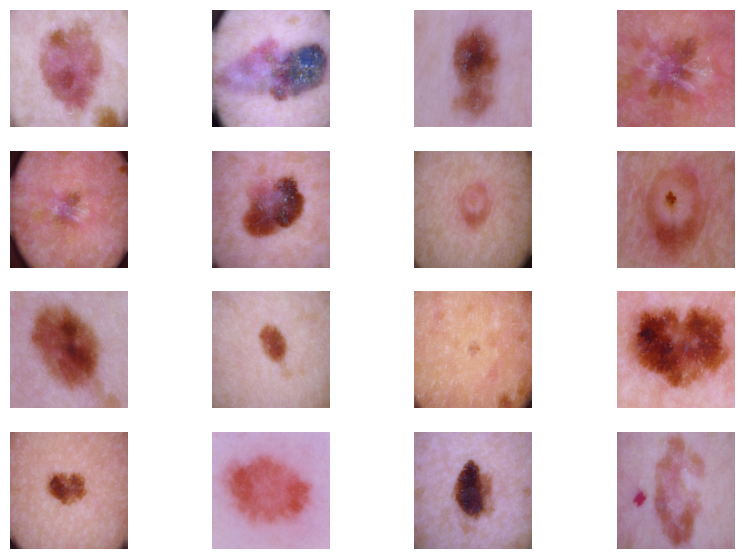

In [ ]:
show_images(df, '/content/images', localization='back', augmentation=hair_remove, st_img_id=30) # посмотреть рандомные изображения с фильтром, убирающим волосы

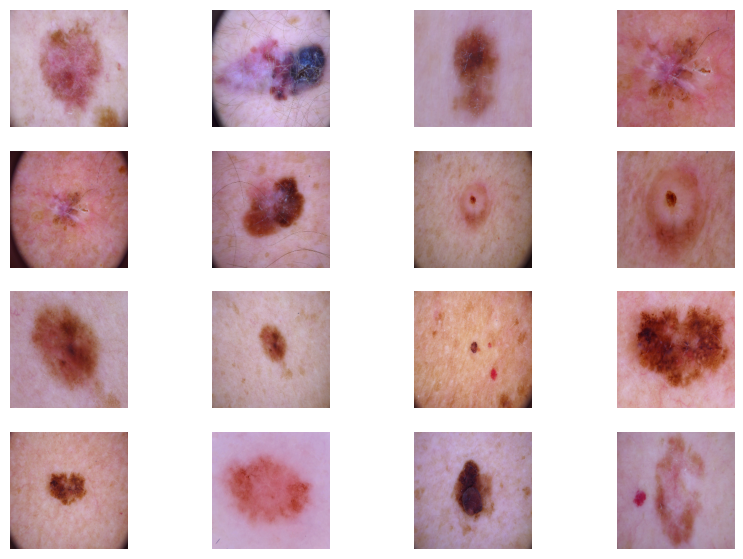

In [ ]:
show_images(df, '/content/images', localization='back', st_img_id=30)

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal", seed=123),
    layers.RandomFlip("vertical", seed=123),
    layers.RandomRotation(factor=(-0.4, 0.4)),
    layers.RandomZoom(0.5),
    layers.RandomBrightness(
        factor=0.1, value_range=(100, 150), seed=123
    ),
  ]
)

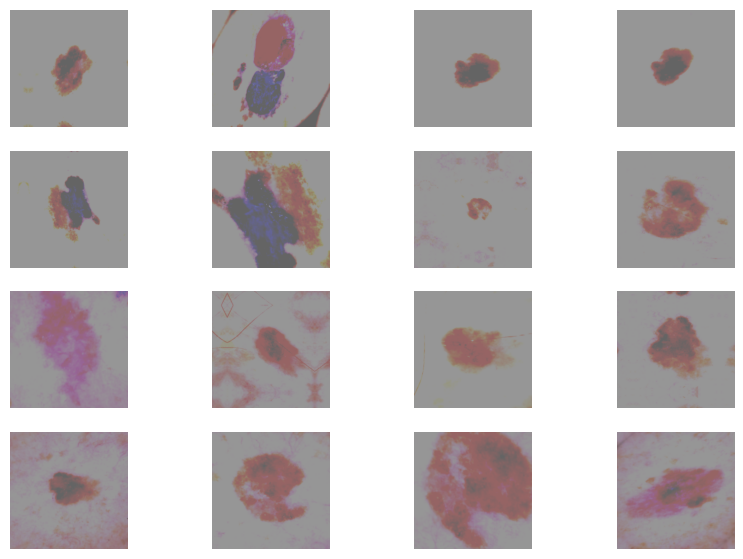

In [ ]:
show_images(df, '/content/images', localization='back', augmentation=data_augmentation, st_img_id=10) # посмотреть рандомные изображения с фильтром, убирающим волосы

In [ ]:
def change_skin_color(img_name, image_folder, skin_color=None):
    frame = cv2.imread(image_folder+'/'+img_name + '.jpg')

    # min_YCrCb = np.array([0, 133, 77], np.uint8)
    # max_YCrCb = np.array([235, 173, 127], np.uint8)
    min_YCrCb = np.array([0, 133, 77], np.uint8)
    max_YCrCb = np.array([235, 190, 127], np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))

    YCrCb_converted = cv2.cvtColor(frame, cv2.COLOR_BGR2YCR_CB)
    skinMask = cv2.inRange(YCrCb_converted, min_YCrCb, max_YCrCb)
    skinMask = cv2.erode(skinMask, kernel, iterations=2)
    skinMask = cv2.dilate(skinMask, kernel, iterations=2)
    skinMask = cv2.GaussianBlur(skinMask, (3, 3), 0)
    skinMask = cv2.bitwise_not(skinMask)
    skin = cv2.bitwise_and(frame, frame, mask=skinMask)

    skin[np.where((skin != [0, 0, 0]).all(axis=2))] = [255, 255, 255]
    frame = cv2.imread(image_folder+'/'+img_name + '.jpg')

    result = cv2.bitwise_and(frame, frame, mask=skinMask)

    if skin_color:
        desired_color = skin_color[::-1] # BGR
        desired_color = np.asarray(desired_color, dtype=np.float64)
        swatch = np.full(frame.shape, desired_color, dtype=np.uint8)
        skinMask_reverse = cv2.bitwise_not(skinMask)
        ave_color = np.array(cv2.mean(frame, mask=skinMask)[:3])


        diff_color = ave_color-desired_color
        diff_color = np.full_like(frame, diff_color, dtype=np.uint8)

        new_img = cv2.subtract(frame, diff_color)

        result = (frame-cv2.bitwise_and(frame, frame, mask=skinMask) + cv2.bitwise_and(new_img, new_img, mask=skinMask))

        result = result.clip(0,255).astype(np.uint8)

    fg, ax = plt.subplots(1, 3, figsize=(7, 3))


    frame = frame.astype(np.float32)/255.
    skin = skin.astype(np.float32)/255.
    result = result.astype(np.float32)/255.

    result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    ax[0].imshow(frame)
    ax[1].imshow(skin)
    ax[2].imshow(result)

    plt.show()

In [ ]:
def save_change_skin_color(img_name, image_folder, save_path_name, out_name, skin_color):
    frame = cv2.imread(image_folder+'/'+img_name + '.jpg')

    min_YCrCb = np.array([0, 133, 77], np.uint8)
    max_YCrCb = np.array([235, 190, 127], np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))

    YCrCb_converted = cv2.cvtColor(frame, cv2.COLOR_BGR2YCR_CB)
    skinMask = cv2.inRange(YCrCb_converted, min_YCrCb, max_YCrCb)
    skinMask = cv2.erode(skinMask, kernel, iterations=2)
    skinMask = cv2.dilate(skinMask, kernel, iterations=2)
    skinMask = cv2.GaussianBlur(skinMask, (3, 3), 0)
    skinMask = cv2.bitwise_not(skinMask)
    skin = cv2.bitwise_and(frame, frame, mask=skinMask)

    skin[np.where((skin != [0, 0, 0]).all(axis=2))] = [255, 255, 255]
    frame = cv2.imread(image_folder+'/'+img_name + '.jpg')

    result = cv2.bitwise_and(frame, frame, mask=skinMask)

    desired_color = skin_color[::-1] # BGR
    desired_color = np.asarray(desired_color, dtype=np.float64)
    swatch = np.full(frame.shape, desired_color, dtype=np.uint8)
    skinMask_reverse = cv2.bitwise_not(skinMask)
    ave_color = np.array(cv2.mean(frame, mask=skinMask)[:3])


    diff_color = ave_color-desired_color
    diff_color = np.full_like(frame, diff_color, dtype=np.uint8)

    new_img = cv2.subtract(frame, diff_color)

    result = (frame-cv2.bitwise_and(frame, frame, mask=skinMask) + cv2.bitwise_and(new_img, new_img, mask=skinMask))

    result = result.clip(0,255).astype(np.uint8)
    cv2.imwrite(save_path_name+f'/{out_name}.jpg', result)

In [ ]:
mask = pd.read_csv('/content/drive/MyDrive/melanoma_nevus/mask.csv')
mask

,image,apply
0,ISIC_0030623,1
1,ISIC_0027190,1
2,ISIC_0031023,0
3,ISIC_0028086,1
4,ISIC_0031177,0
...,...,...
2095,ISIC_0029242,0
2096,ISIC_0029265,1
2097,ISIC_0029271,1
2098,ISIC_0029272,0


In [ ]:
RGB_color = [(141,85,36),
            (198,134,66),
             (200,80,50),
             (190,120,70),
             (190,120,120),
             (190,150,150),
             ]

for i, row in mask.iterrows():
    img = row.image
    if i%100 == 0:
        print(f'{i}`th index proceeded')
    if row['apply'] == 1:
        for idx, color in enumerate(RGB_color):
            save_change_skin_color(img, 'images', 'images', f'{img}_{idx}', color)
            df[len(df)] = row
            df[len(df)].image_id = f'{img}_{idx}'

0`th index proceeded
100`th index proceeded
200`th index proceeded
300`th index proceeded
400`th index proceeded
500`th index proceeded
600`th index proceeded
700`th index proceeded
800`th index proceeded
900`th index proceeded
1000`th index proceeded
1100`th index proceeded
1200`th index proceeded
1300`th index proceeded
1400`th index proceeded
1500`th index proceeded
1600`th index proceeded
1700`th index proceeded
1800`th index proceeded
1900`th index proceeded
2000`th index proceeded


2000


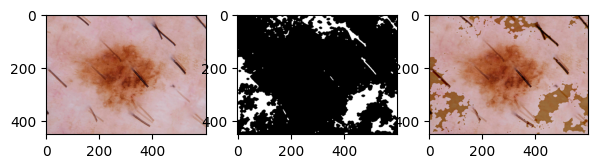

Подходит - 1: 
2001


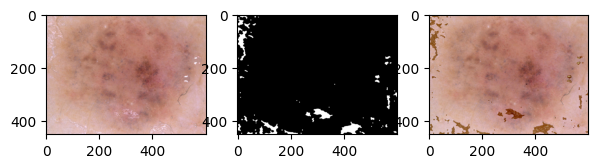

Подходит - 1: 
2002


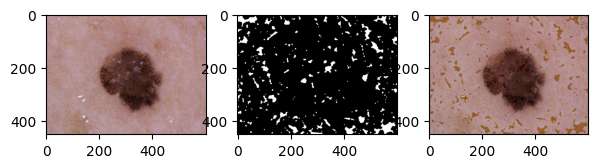

Подходит - 1: 
2003


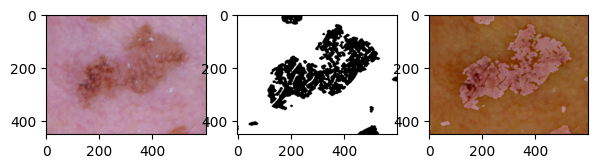

Подходит - 1: д
2004


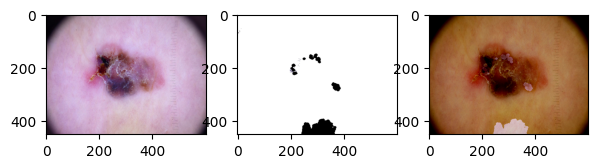

Подходит - 1: 
2005


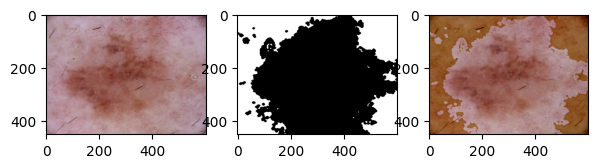

Подходит - 1: ж
2006


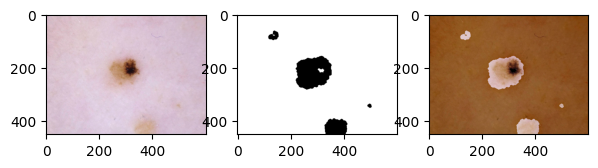

Подходит - 1: ж
2007


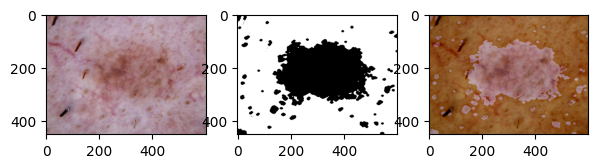

Подходит - 1: ж
2008


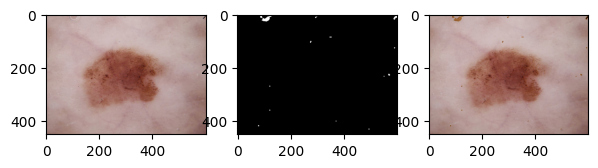

Подходит - 1: 
2009


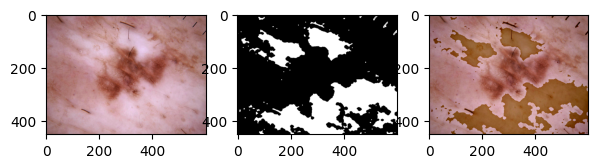

Подходит - 1: 
2010


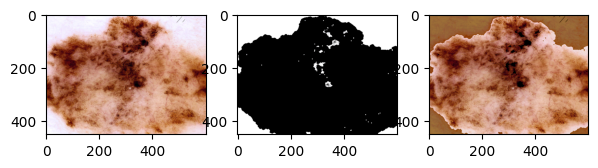

Подходит - 1: ж
2011


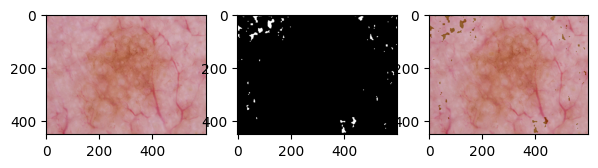

Подходит - 1: 
2012


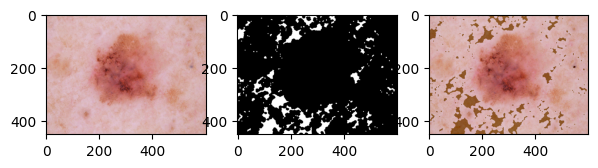

Подходит - 1: 
2013


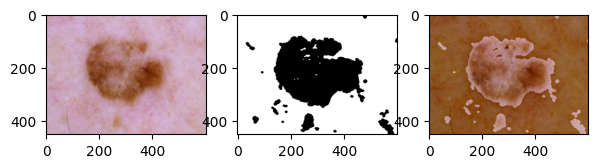

Подходит - 1: ж
2014


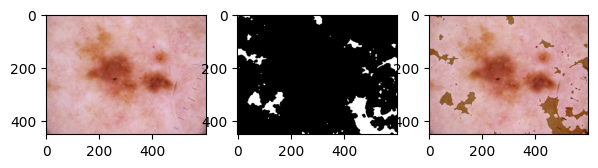

Подходит - 1: 
2015


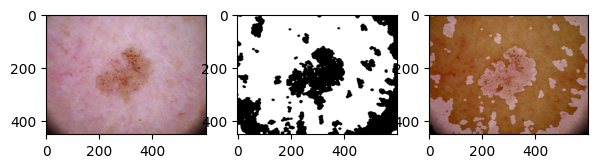

Подходит - 1: 
2016


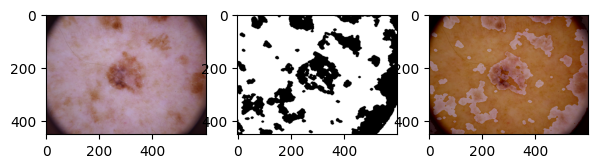

Подходит - 1: 
2017


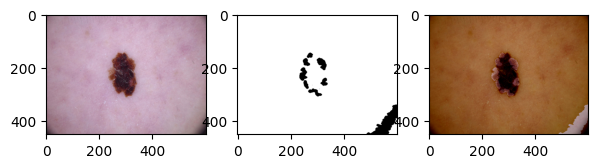

Подходит - 1: 
2018


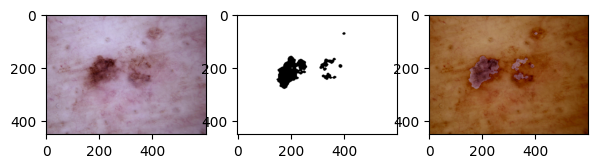

Подходит - 1: ж
2019


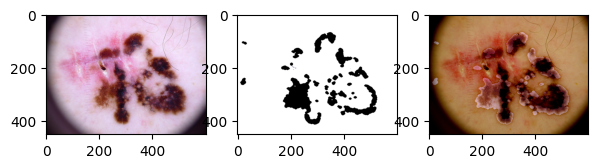

Подходит - 1: 
2020


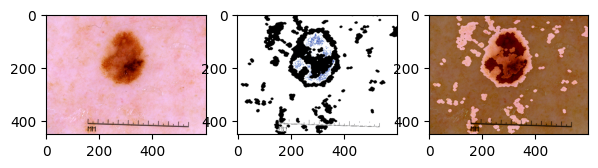

Подходит - 1: ж
2021


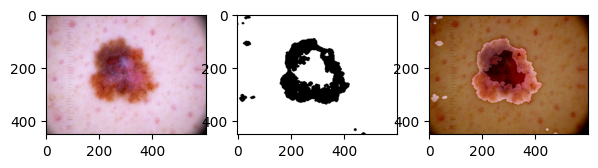

Подходит - 1: ж
2022


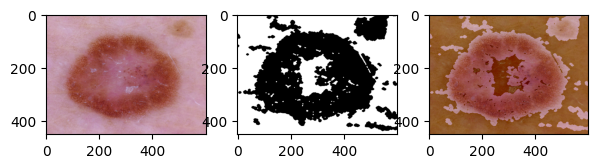

Подходит - 1: ж
2023


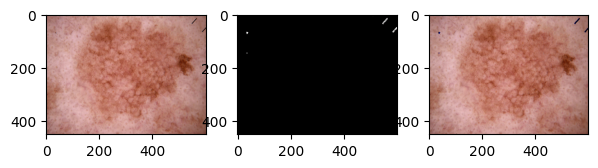

Подходит - 1: 
2024


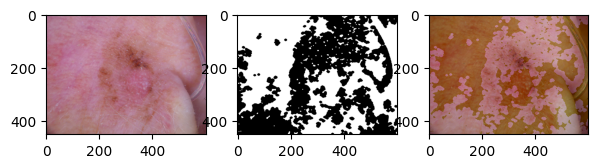

Подходит - 1: 
2025


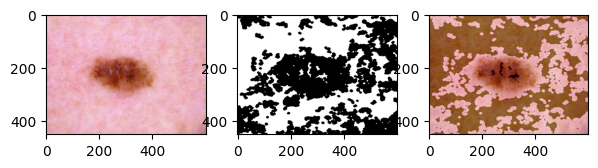

Подходит - 1: 
2026


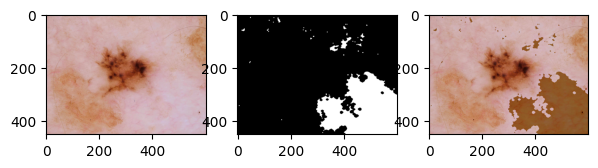

Подходит - 1: 
2027


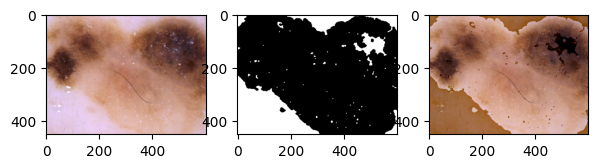

Подходит - 1: юд
2028


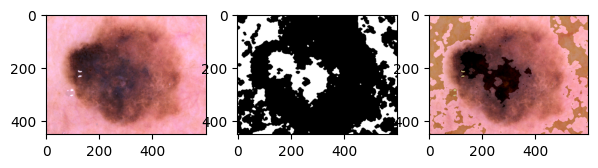

Подходит - 1: 
2029


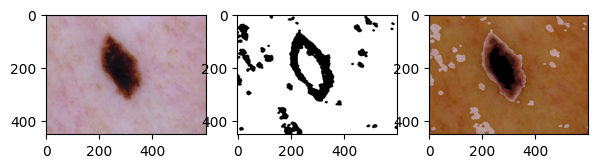

Подходит - 1: 
2030


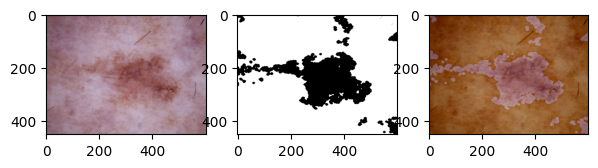

Подходит - 1: а
2031


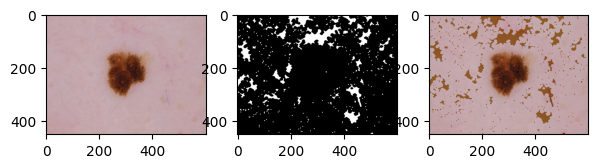

Подходит - 1: 
2032


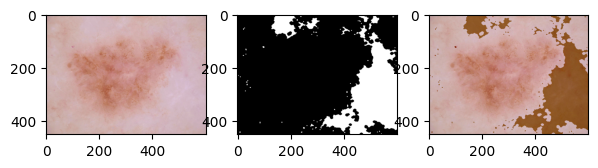

Подходит - 1: 
2033


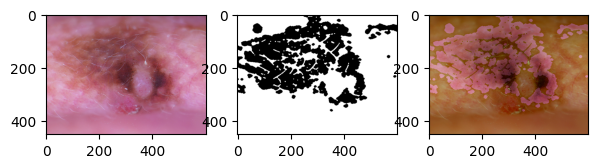

Подходит - 1: 
2034


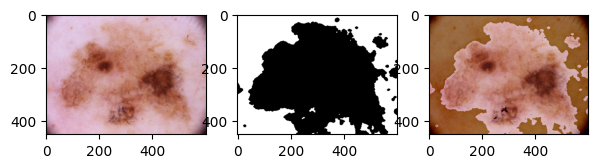

Подходит - 1: д
2035


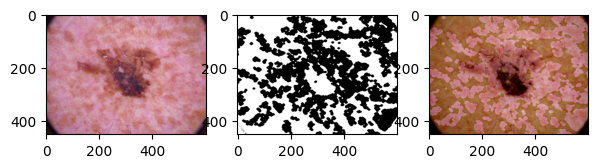

Подходит - 1: 
2036


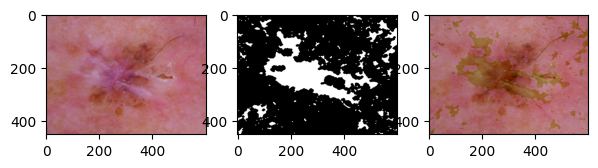

Подходит - 1: 
2037


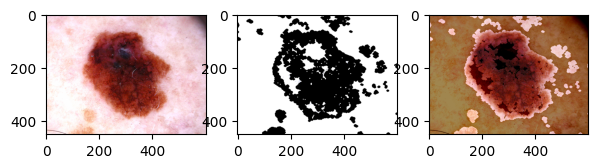

Подходит - 1: д
2038


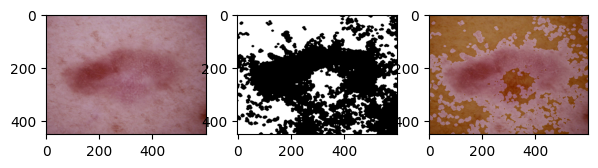

Подходит - 1: 
2039


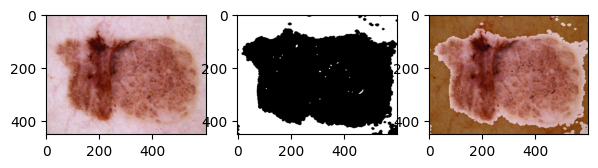

Подходит - 1: д
2040


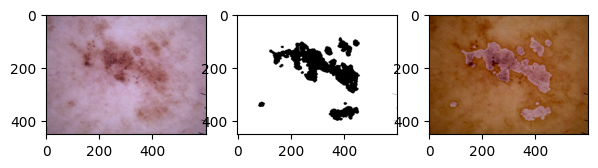

Подходит - 1: л
2041


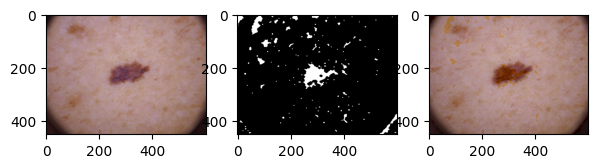

Подходит - 1: 
2042


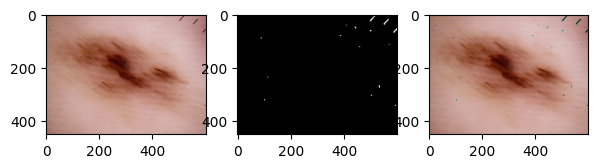

Подходит - 1: 
2043


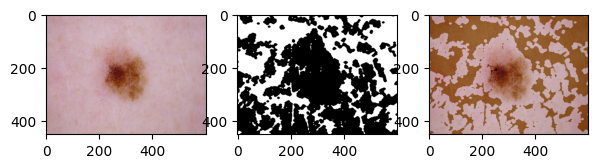

Подходит - 1: 
2044


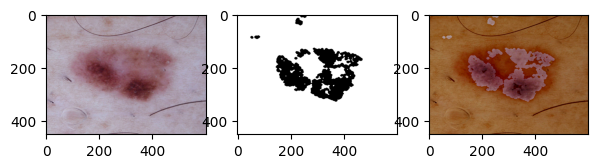

Подходит - 1: л
2045


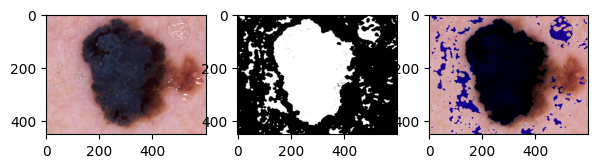

Подходит - 1: 
2046


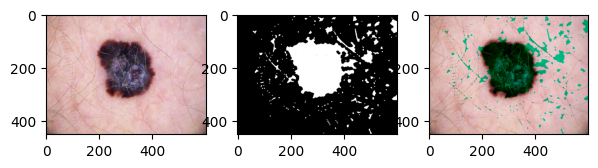

Подходит - 1: 
2047


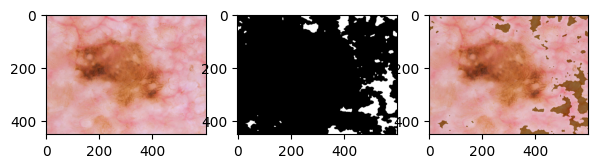

Подходит - 1: 
2048


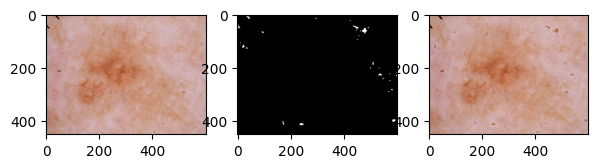

Подходит - 1: 
2049


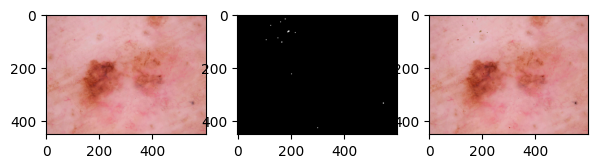

Подходит - 1: 
2050


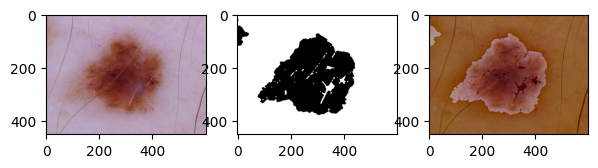

Подходит - 1: д
2051


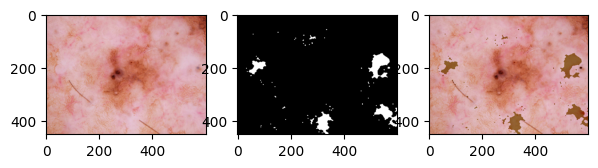

Подходит - 1: 
2052


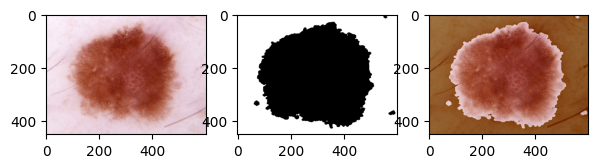

Подходит - 1: ж
2053


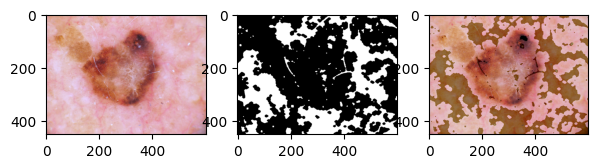

Подходит - 1: 
2054


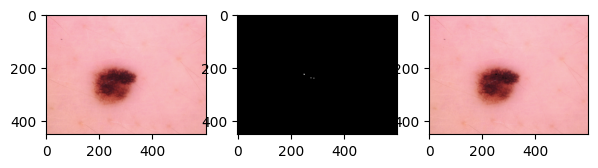

Подходит - 1: 
2055


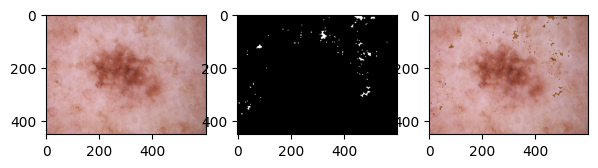

Подходит - 1: 
2056


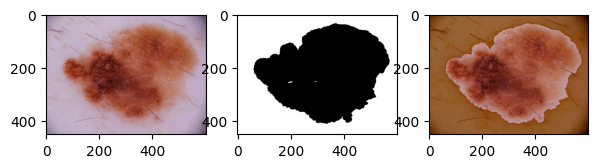

Подходит - 1: д
2057


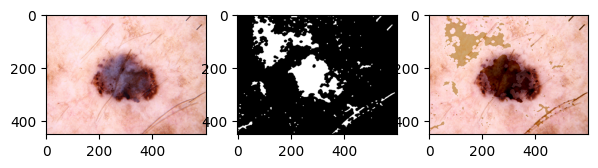

Подходит - 1: 
2058


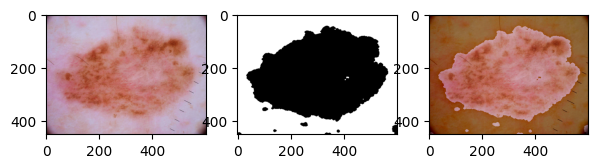

Подходит - 1: д
2059


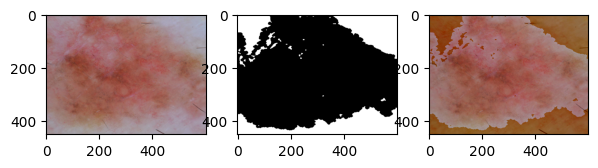

Подходит - 1: д
2060


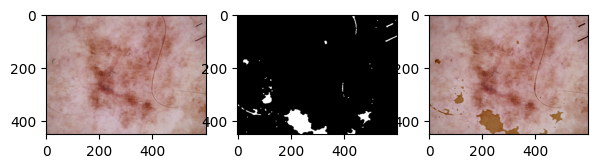

Подходит - 1: 
2061


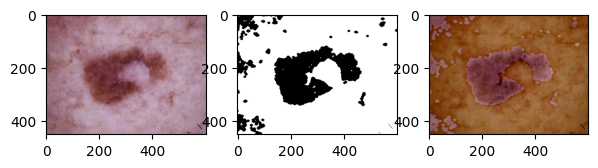

Подходит - 1: д
2062


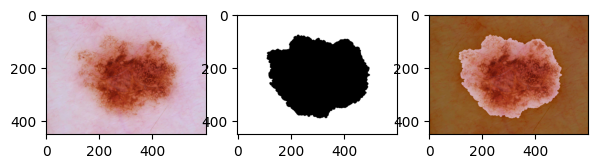

Подходит - 1: д
2063


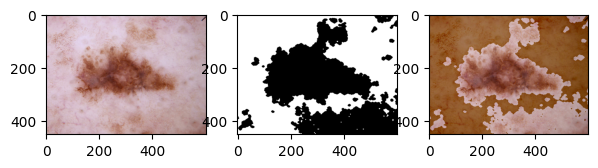

Подходит - 1: 
2064


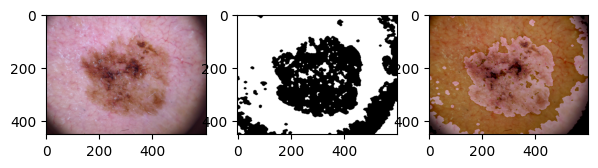

Подходит - 1: 
2065


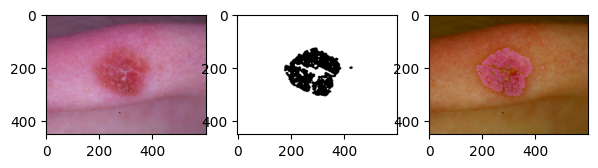

Подходит - 1: д
2066


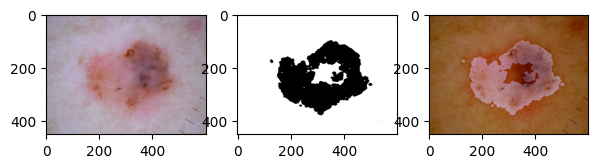

Подходит - 1: д
2067


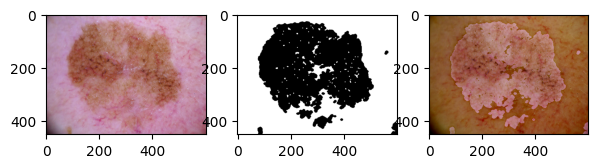

Подходит - 1: д
2068


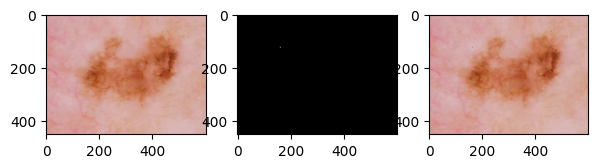

Подходит - 1: 
2069


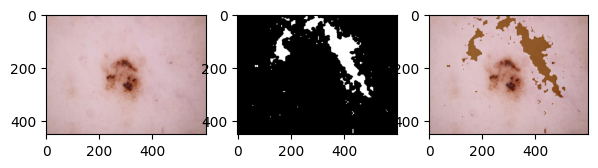

Подходит - 1: 
2070


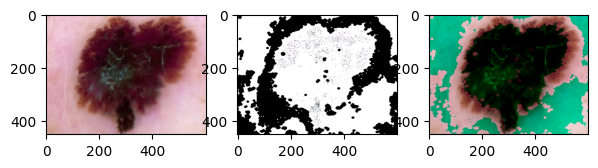

Подходит - 1: 
2071


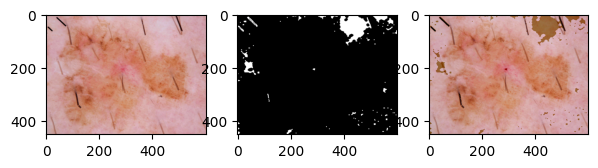

Подходит - 1: 
2072


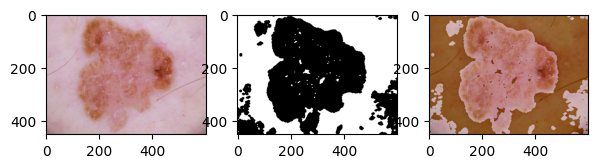

Подходит - 1: л
2073


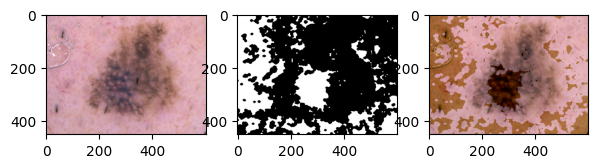

Подходит - 1: 
2074


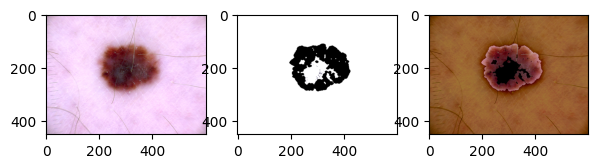

Подходит - 1: д
2075


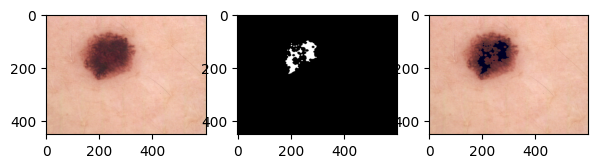

Подходит - 1: 
2076


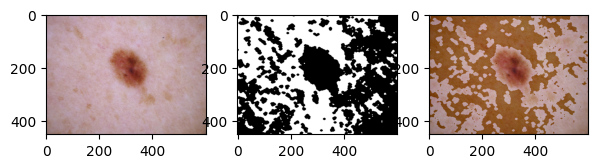

Подходит - 1: 
2077


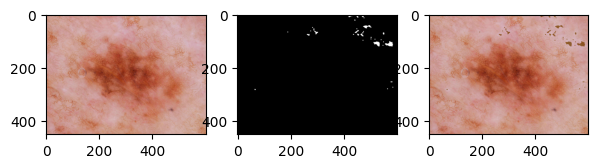

Подходит - 1: 
2078


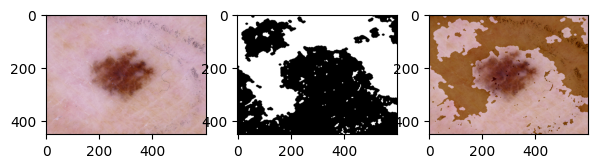

Подходит - 1: 
2079


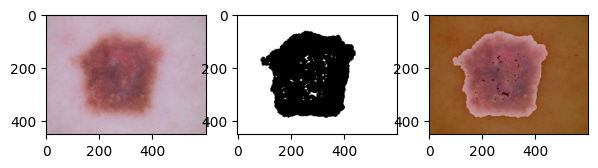

Подходит - 1: л
2080


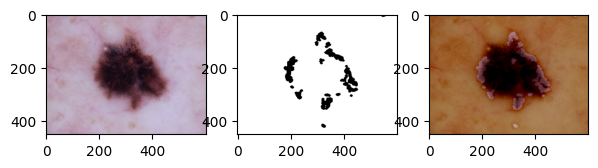

Подходит - 1: 
2081


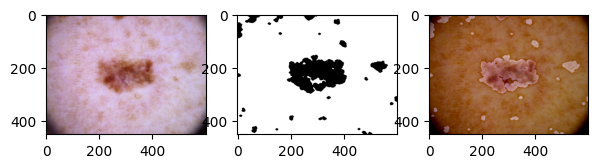

Подходит - 1: л
2082


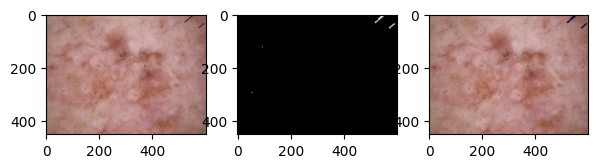

Подходит - 1: 
2083


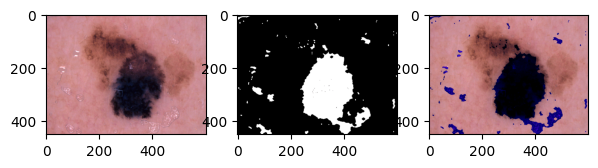

Подходит - 1: 
2084


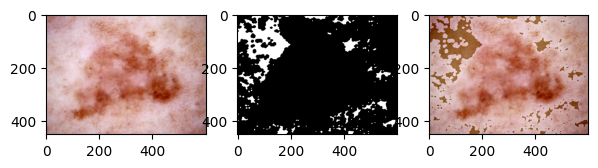

Подходит - 1: 
2085


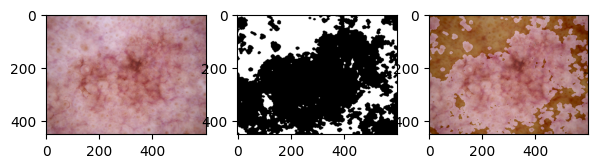

Подходит - 1: 
2086


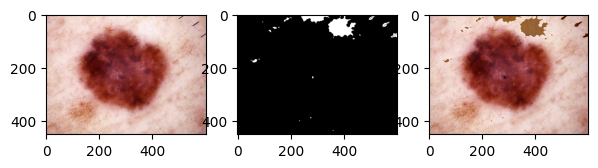

Подходит - 1: 
2087


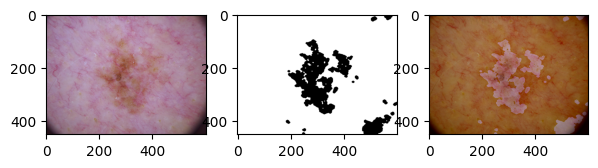

Подходит - 1: д
2088


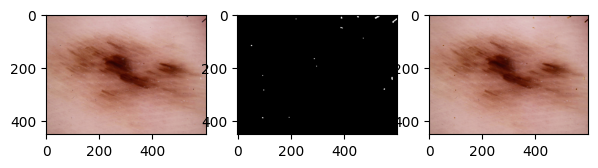

Подходит - 1: 
2089


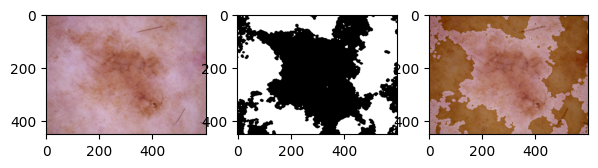

Подходит - 1: 
2090


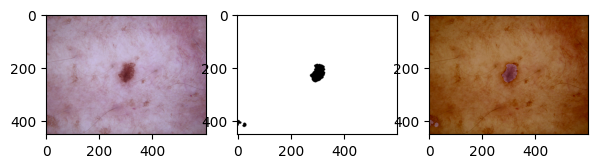

Подходит - 1: д
2091


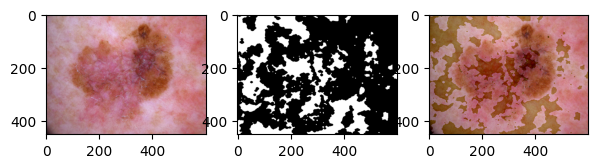

Подходит - 1: 
2092


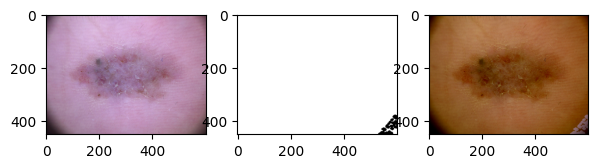

Подходит - 1: 
2093


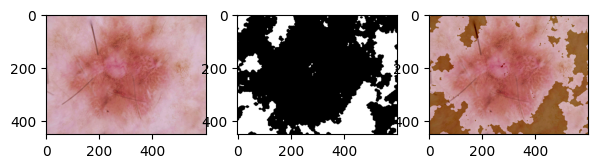

Подходит - 1: 
2094


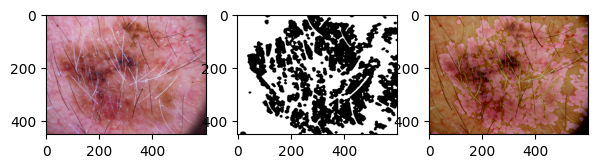

Подходит - 1: л
2095


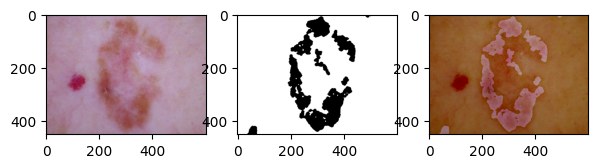

Подходит - 1: 
2096


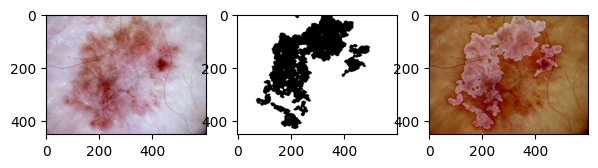

Подходит - 1: д
2097


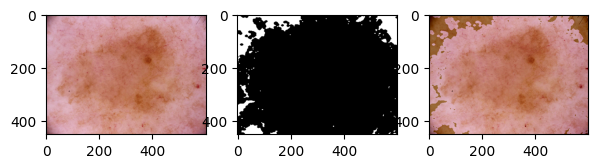

Подходит - 1: л
2098


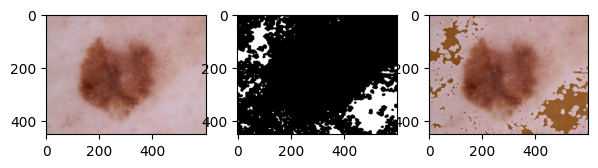

Подходит - 1: 
2099


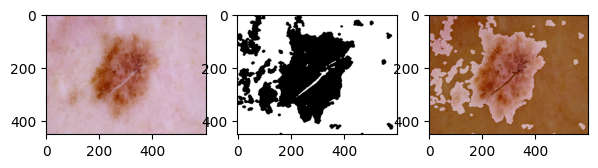

Подходит - 1: д
2100


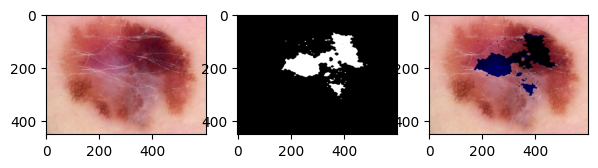

KeyboardInterrupt: Interrupted by user

In [ ]:
for i in range(2100, 2500):
    print(i)
    img = df[df.dx == 'mel'].image_id.tolist()[i]
    change_skin_color(img, 'images/ISIC_2019_MEL_NV', RGB_color[0])
    time.sleep(0.3)
    choose = input('Подходит - 1: ')
    if choose != '':
        mask.loc[len(mask)] = [img, 1]
    else:
        mask.loc[len(mask)] = [img, 0]

In [ ]:
!mkdir -p train/melanoma
!mkdir -p train/nevus
!mkdir -p test/melanoma
!mkdir -p test/nevus

In [ ]:
for i, row in df.iterrows():
    df.loc[df.index==i, 'image_id'] = row.image_id + '.jpg'

In [ ]:
# Delete dublicates

df = df.drop_duplicates(subset=['image_id']).reset_index()

In [ ]:
df.dx.value_counts()

,count
dx,
nv,15370
mel,6729


In [ ]:
def move_images(folder_from, folder_to, img_name):
    os.rename(folder_from+f'/{img_name}', folder_to+f'/{img_name}')

def move_back(folder_from, folder_to, img_name):
    os.rename(folder_from+f'/{img_name}', folder_to+f'/{img_name}')

def create_tf_dataset(image_folder, df, class_header, train_num, test_num):
    assert train_num+test_num == 1.0
    classes = df[class_header].unique()
    print('Классы:', classes)

    mel = np.array(df[df.dx == 'mel'].image_id)
    nv = np.array(df[df.dx == 'nv'].image_id)

    random.shuffle(mel)
    random.shuffle(nv)

    train_mel = mel[ : int(len(mel)*train_num)]
    mel_train_size = len(train_mel)
    train_nv = nv[ : int(mel_train_size*1.1)]

    test_mel = mel[mel_train_size : ]
    test_nv = nv[len(train_nv) : len(train_nv) + len(test_mel)]

    for img in train_mel:
        move_images(image_folder, 'train/melanoma', img)
    for img in test_mel:
        move_images(image_folder, 'test/melanoma', img)

    for img in train_nv:
        move_images(image_folder, 'train/nevus', img)
    for img in test_nv:
        move_images(image_folder, 'test/nevus', img)

In [ ]:
create_tf_dataset('images', df, 'dx', 0.8, 0.2)

Классы: ['nv' 'mel']
Train: mel: 5383, nv: 5921
Test: mel: 1346, nv: 1346


In [ ]:
print(f'Train: mel: {len(glob.glob("train/melanoma/*.jpg"))}, nv: {len(glob.glob("train/nevus/*.jpg"))}')
print(f'Test: mel: {len(glob.glob("test/melanoma/*.jpg"))}, nv: {len(glob.glob("test/nevus/*.jpg"))}')

Train: mel: 6442, nv: 7290
Test: mel: 1346, nv: 1346


In [ ]:
def undo(image_folder):
    for img in glob.glob('train/melanoma/*'):
        move_back('train/melanoma', image_folder, img[img.rfind('/')+1:])
    for img in glob.glob('train/nevus/*'):
        move_back('train/nevus', image_folder, img[img.rfind('/')+1:])
    for img in glob.glob('test/melanoma/*'):
        move_back('test/melanoma', image_folder, img[img.rfind('/')+1:])
    for img in glob.glob('test/nevus/*'):
        move_back('test/nevus', image_folder, img[img.rfind('/')+1:])

In [ ]:
undo('images')

In [ ]:
data_dir_train = pathlib.Path("train") # путь к изобраениям для тренировки
data_dir_test = pathlib.Path("test") # путь к изобраениям для теста
dir_path = os.getcwd() # корневой путь

In [ ]:
# реальные файлы изображений в наших папках для тренировки (data_dir_train), путь к папках можно менятьб но он должен быть полным
files_train_nv = next(os.walk(os.path.join(dir_path, data_dir_train, 'nevus')), (None, None, []))[2]
files_train_mel = next(os.walk(os.path.join(dir_path, data_dir_train, 'melanoma')), (None, None, []))[2]

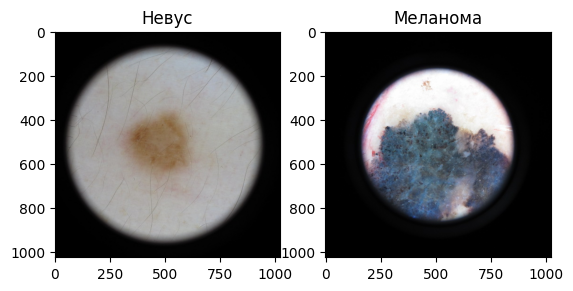

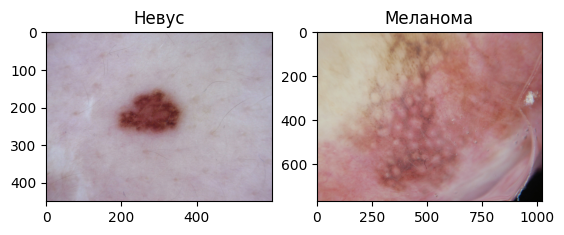

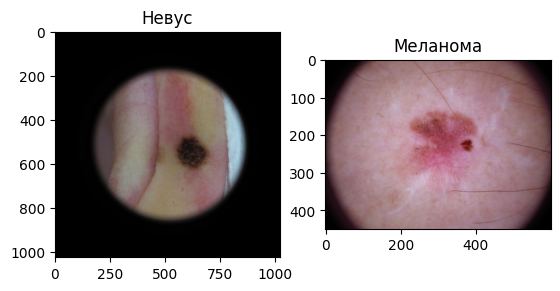

In [ ]:
k = 3 # счетчик пар (невус, меланома)
random.shuffle(files_train_nv)
random.shuffle(files_train_mel)
for img1, img2 in zip(files_train_nv, files_train_mel):
    if k == 0:
        break
    # если сразу 2 избражения в папках, выводим сначала доброкачественное, затем справа меланому
    # стиль изображений COLOR_RGB2GRAY
    if img1 in files_train_nv and img2 in files_train_mel:
        image = cv2.imread(os.path.join('train/nevus', img1))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title('Невус')
        image2 = cv2.imread(os.path.join('train/melanoma', img2))
        image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
        im2 = plt.subplot(1, 2, 2)
        plt.imshow(image2)
        plt.title('Меланома')
        plt.show()
        k -= 1